In [12]:
import pandas as pd
from tensorflow.python.keras.layers import Input, Dense, Dropout
from tensorflow.python.keras import Model
from tensorflow.python.keras.metrics import RootMeanSquaredError
from sklearn.model_selection import train_test_split
from tensorflow.python.keras.optimizers import adam_v2, gradient_descent_v2
from tensorflow.python.keras.callbacks import EarlyStopping
from matplotlib import pyplot as plt

In [2]:
def get_model(input_shape, num_output):
    input_tensor = Input(shape=input_shape)
    drop_out_tensor = Dropout(.2)(input_tensor)
    hidden_tensor = Dense(10)(drop_out_tensor)
    output_tensor = Dense(num_output)(hidden_tensor)
    model = Model(input_tensor, output_tensor)

    return model

In [3]:
train_df = pd.read_csv('training_6_category_1/preprocessed.csv')
train_df['type_sensor_1'] = train_df['type_sensor_1'].astype('category')
train_df['type_sensor_2'] = train_df['type_sensor_2'].astype('category')
train_df['type_sensor_3'] = train_df['type_sensor_3'].astype('category')

X = train_df.drop(columns=['latitude_aircraft', 'longitude_aircraft', 'geoAltitude', 'baroAltitude'])
Y = train_df[['latitude_aircraft', 'longitude_aircraft', 'geoAltitude', 'baroAltitude']]
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=42)

In [4]:
models_history = []

early_stopping = EarlyStopping(patience=2)

learning_rates = [.00001, .001, .01, 1]

In [6]:
for lr in learning_rates:
    model = get_model((len(X.columns),), len(Y.columns))
    optimizer = adam_v2.Adam(learning_rate=lr)
    model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=[RootMeanSquaredError()])

    models_history.append(model.fit(X_train, y_train, epochs=30, validation_split=0.3, callbacks=[early_stopping]))

2023-02-11 11:27:11.433836: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 144645760 exceeds 10% of free system memory.


Epoch 1/30
28252/28252 [==============================] - 139s 5ms/step - loss: 4656.2915 - root_mean_squared_error: 6922.9233 - val_loss: 4652.9160 - val_root_mean_squared_error: 6921.1865

2023-02-11 12:06:35.199785: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 144645760 exceeds 10% of free system memory.


Epoch 1/30
28252/28252 [==============================] - 68s 2ms/step - loss: 1962.7515 - root_mean_squared_error: 3571.2769 - val_loss: 1229.6350 - val_root_mean_squared_error: 2246.8579

2023-02-11 12:17:45.642552: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 144645760 exceeds 10% of free system memory.


Epoch 1/30
28252/28252 [==============================] - 48s 2ms/step - loss: 1263.1143 - root_mean_squared_error: 2532.6973 - val_loss: 1147.4856 - val_root_mean_squared_error: 2389.9753

2023-02-11 12:20:11.379025: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 144645760 exceeds 10% of free system memory.


Epoch 1/30
28252/28252 [==============================] - 47s 2ms/step - loss: 1176.1302 - root_mean_squared_error: 2405.0789 - val_loss: 1163.7512 - val_root_mean_squared_error: 2463.3806

In [7]:
models_history[0].history.keys()

dict_keys(['loss', 'root_mean_squared_error', 'val_loss', 'val_root_mean_squared_error'])

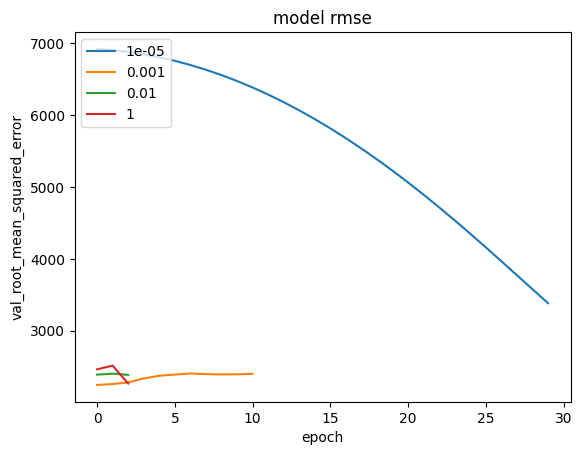

In [8]:
for mh in models_history:
    plt.plot(mh.history['val_root_mean_squared_error'])
plt.title('model rmse')
plt.ylabel('val_root_mean_squared_error')
plt.xlabel('epoch')
plt.legend(learning_rates, loc='upper left')
plt.show()

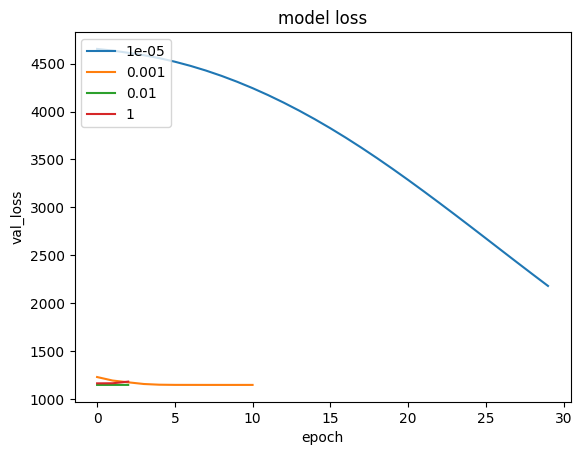

In [9]:
for mh in models_history:
    plt.plot(mh.history['val_loss'])
plt.title('model loss')
plt.ylabel('val_loss')
plt.xlabel('epoch')
plt.legend(learning_rates, loc='upper left')
plt.show()

In [10]:
models_history2 = []

In [13]:
for lr in learning_rates:
    model = get_model((len(X.columns),), len(Y.columns))
    optimizer = gradient_descent_v2.SGD(learning_rate=lr)
    model.compile(optimizer=optimizer, loss='mean_absolute_error', metrics=[RootMeanSquaredError()])

    models_history2.append(model.fit(X_train, y_train, epochs=30, validation_split=0.3, callbacks=[early_stopping]))

2023-02-11 12:29:35.288039: W tensorflow/tsl/framework/cpu_allocator_impl.cc:82] Allocation of 144645760 exceeds 10% of free system memory.


Epoch 1/30
28252/28252 [==============================] - 52s 2ms/step - loss: 4659.1665 - root_mean_squared_error: 6925.4878 - val_loss: 4660.2290 - val_root_mean_squared_error: 6927.8936

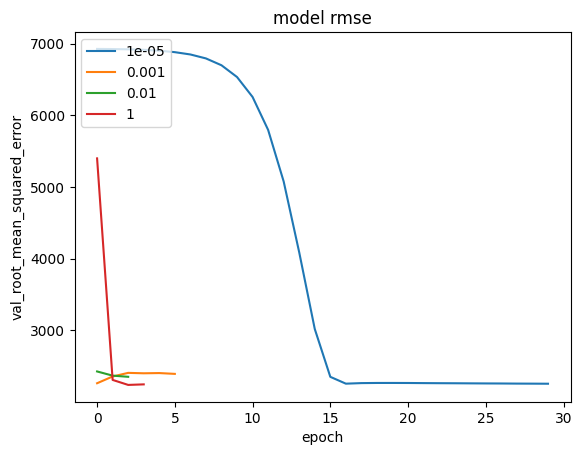

In [14]:
for mh in models_history2:
    plt.plot(mh.history['val_root_mean_squared_error'])
plt.title('model rmse')
plt.ylabel('val_root_mean_squared_error')
plt.xlabel('epoch')
plt.legend(learning_rates, loc='upper left')
plt.show()

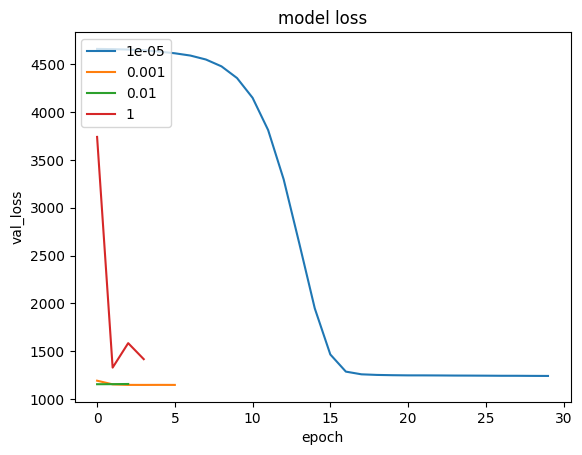

In [15]:
for mh in models_history2:
    plt.plot(mh.history['val_loss'])
plt.title('model loss')
plt.ylabel('val_loss')
plt.xlabel('epoch')
plt.legend(learning_rates, loc='upper left')
plt.show()